# Install dependencies

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

MessageError: ignored

In [ ]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

In [ ]:
print(locale.getpreferredencoding())

In [ ]:
!pip install ultralytics
!pip install -U lapx>=0.5.2

# Imports

In [ ]:
from lxml import etree
import os
import json

from ultralytics import YOLO

import os
from os.path import join as opj
from matplotlib import pyplot as plt
import numpy as np
import cv2
import shutil

from tqdm.auto import tqdm

from IPython import display
from PIL import Image

In [ ]:
# import wandb
# wandb.init(mode="disabled")

# Constants

YOLO_CHECKPOINT examples:
* 1) yolov8n (the smallest model created only for testing the functionality of the script)
* 2) yolov8s (basic model to test the possibility of training on data in a small amount of time and a small amount of resources)
* 3) yolov8m (a model to get good results)
* 4) yolov8l (model to get better results than yolov8m, but requires more computing resources)
* 5) yolov8x (the largest model. There is not much difference between yolov8l and yolov8x. yolov8x is usually used to improve the result by several percent (sometimes even tenths of a percent)

In [ ]:
DATASET_DIR = "/content/drive/MyDrive/Optimizing_traffic_lights_project/total_dataset"
VAL_PERCENT, TEST_PERCENT = 0.2, 0.1 # dataset is divided into train, validation and test according to these values multiplied by 100%. TRAIN_PERCENT = 1 - (VAL_PERCENT + TEST_PERCENT)
YOLO_DATASET_DIR = "/content/drive/MyDrive/Optimizing_traffic_lights_project/total_dataset/yolo_dataset2" # directory to save dataset in yolo format

YOLO_CHECKPOINT = "yolov8s"
EPOCHS = 60 # number of epochs. One epoch is a single pass through the entire dataset. The number of epochs to use depends on the size of the dataset. Too many epochs can lead to overfitting, which can be detected by monitoring the validation loss during training. Too few epochs can result in underfitting, which can be identified by a consistently "sharp" decrease in the loss.
IMGSZ = 640 # size of image side for forwarding. Larger size means more attention to small details, and therefore more quality in images where objects are very small. Large image size requires a lot of computing resources during training
TRAIN_BATCH_SIZE = 16 # batch size per iteration on one GPU. It is ideally in the form of a power of two (2, 4, 8)
NOMINAL_BATCH_SIZE = 64 # size of nominal batch (which is divided into batches by train batch size)

In [ ]:
# variables to convert label/id to id/label
# category = {"car": 1, "smallbus": 2, "largebus":3, "truck":4, "trailer": 5, "motorcycle(cycle)": 6, "pedestrian": 7}
direction= {"none": 0, "straight": 1, "left": 2, "right": 3, "straight-left": 4, "straight-right": 5, "waiting": 6, "crossing": 7}
label2id=dict()

num=0
for i in direction.keys():
    label2id[i]=direction[i]
print(label2id)
id2label = {v: k for k, v in label2id.items()}

{'none': 0, 'straight': 1, 'left': 2, 'right': 3, 'straight-left': 4, 'straight-right': 5, 'waiting': 6, 'crossing': 7}


# Convert dataset to yolo format

Yolo directory format:
dataset/

    images/
    
        train/
        
            *.png/*.jpg/*.jpeg/...
            
        val/
        
            *.png/*.jpg/*.jpeg/...
            
    labels/
    
        train/
        
            *.txt
            
        val/
        
            *.txt
            
dataset.yaml

_____________________

Each annotation file has N lines. Each line is a bbox in format:

 \<class_id> \<annotation_xcenter> \<annotation_ycenter> \<annotation_width> \<annotation_height>


In [ ]:
# json 파일 경로와 파일 이름 // 이미지 경로 설정(이미지 경로는 장소 디렉터리까지만, 카메라는 X)# json_dirpath='/content/drive/MyDrive/Optimizing_traffic_lights_project/total_dataset/labeling_data/training/교통안전(Bbox)/연구단지네거리/' # json 파일 디렉터리 설정
json_filename='/content/drive/MyDrive/Optimizing_traffic_lights_project/total_dataset/labeling_data/training/교통안전(Bbox)/concatenated_label.json' # json 파일 이름 설정
img_dirpath='/content/drive/MyDrive/Optimizing_traffic_lights_project/total_dataset/image_data/training/교통안전(Bbox)' # 이미지 디렉터리 설정

In [ ]:
# json 파일 읽기
# json_file_path = os.path.join(json_dirpath, json_filename)
with open(json_filename, 'r',encoding="utf-8") as json_file:
  json_data = json.load(json_file)

print(f"이미지 개수: {len(json_data['images'])}장")

이미지 개수: 10391장


In [ ]:
def get_image_dimensions(image_path):
    with Image.open(image_path) as img:
        width, height = img.size
    return width, height

In [ ]:
data = dict()

for i in range(len(json_data["annotations"])):
    img_filename=json_data["images"][i]['file_name']
    filepath = opj(img_dirpath,img_filename)
    w_img, h_img = 1920,1080

    boxes = []
    for j in range(len(json_data["annotations"][i]['bbox'])):
        x_min, y_min, x_max, y_max = json_data["annotations"][i]['bbox'][j]
        x_min, y_min = float(x_min)/w_img, float(y_min)/h_img
        x_max, y_max = float(x_max)/w_img, float(y_max)/h_img
        x_center = (x_min + x_max) / 2.0
        y_center = (y_min + y_max) / 2.0
        yolo_box = [x_center, y_center, x_max - x_min, y_max - y_min]
        box_data = [json_data["annotations"][i]['direction'][j]] + yolo_box
        boxes.append(box_data)
    data[filepath] = boxes

In [ ]:
# split on train/validation/test
# since only one video is given in the dataset, divided into frames, it is most advisable to take frames for validation and test not random, but sequential
# therefore, here script divides timeline of frames into three sub-timelines: train/eval/test

paths = list(data.keys())

train_split = int((1 - (VAL_PERCENT + TEST_PERCENT)) * len(paths))
train_paths, nontrain_paths = paths[:train_split], paths[train_split:]

nontrain_split = int((VAL_PERCENT / (VAL_PERCENT + TEST_PERCENT)) * len(nontrain_paths))
eval_paths, test_paths = nontrain_paths[:nontrain_split], nontrain_paths[nontrain_split:]

In [ ]:
len(train_paths), len(eval_paths), len(test_paths)

(7271, 2078, 1039)

In [ ]:
# save annotations and images to yolo dataset folder
for data_type, paths in [("train", train_paths), ("val", eval_paths), ("test", test_paths)]:
    images_path = opj(YOLO_DATASET_DIR, "images", data_type)
    annotations_path = opj(YOLO_DATASET_DIR, "labels", data_type)

    os.makedirs(images_path, exist_ok=True)
    os.makedirs(annotations_path, exist_ok=True)

    for path in tqdm(paths):
        boxes = data[path]
        name = path.replace("\\", "/").split("/")[-1]
        annotation_content = "\n".join(map(lambda box: " ".join(map(str, box)), boxes))

        shutil.copy(path, opj(images_path, name))
        with open(opj(annotations_path, name.split(".")[0] + ".txt"), "w") as f:
            f.write(annotation_content)

  0%|          | 0/7271 [00:00<?, ?it/s]

  0%|          | 0/2078 [00:00<?, ?it/s]

  0%|          | 0/1039 [00:00<?, ?it/s]

In [ ]:
# create dataset.yaml config
names_content = "\n".join([f"  {label_id}: {label}" for label, label_id in label2id.items()])
dataset_content = f"""
path: "{YOLO_DATASET_DIR}/"
train: "images/train"
val: "images/val"
test: "images/test"
names:
{names_content}
"""
with open(opj(YOLO_DATASET_DIR, "dataset2.yaml"), "w") as f:
    f.write(dataset_content)

# Train

In [ ]:
ㅇ# Load a model
model = YOLO(YOLO_CHECKPOINT)

# Train the model
model.train(data=opj(YOLO_DATASET_DIR, "dataset2.yaml"), epochs=EPOCHS, imgsz=IMGSZ, batch=TRAIN_BATCH_SIZE, nbs=NOMINAL_BATCH_SIZE)

100%|██████████| 21.5M/21.5M [00:00<00:00, 287MB/s]
Ultralytics YOLOv8.0.198 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/drive/MyDrive/Optimizing_traffic_lights_project/total_dataset/yolo_dataset2/dataset2.yaml, epochs=30, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=F

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x780ba4cfe2f0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,

# Test

In [ ]:
model = YOLO('/content/drive/MyDrive/Optimizing_traffic_lights_project/models/10300data_30epoch/weights/best.pt')  # load a custom model from local_path example

## Image predict

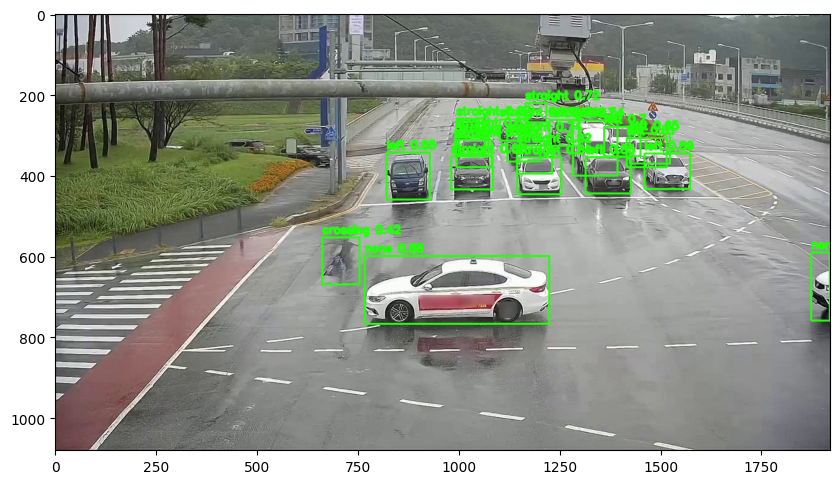

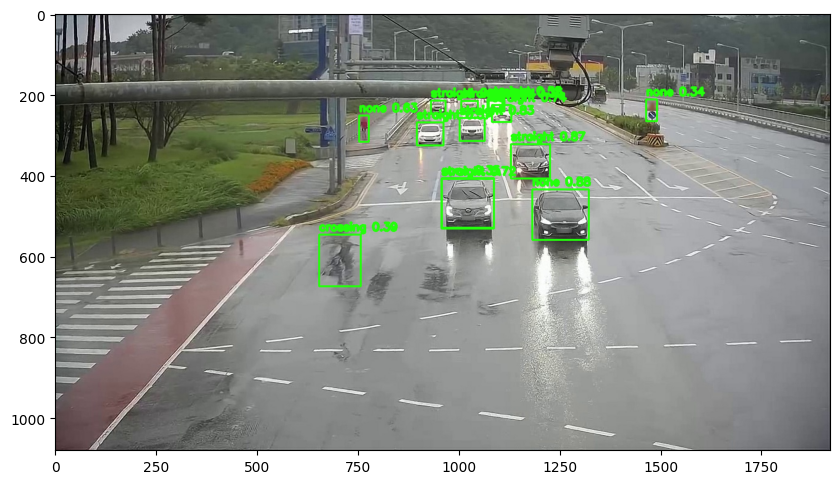

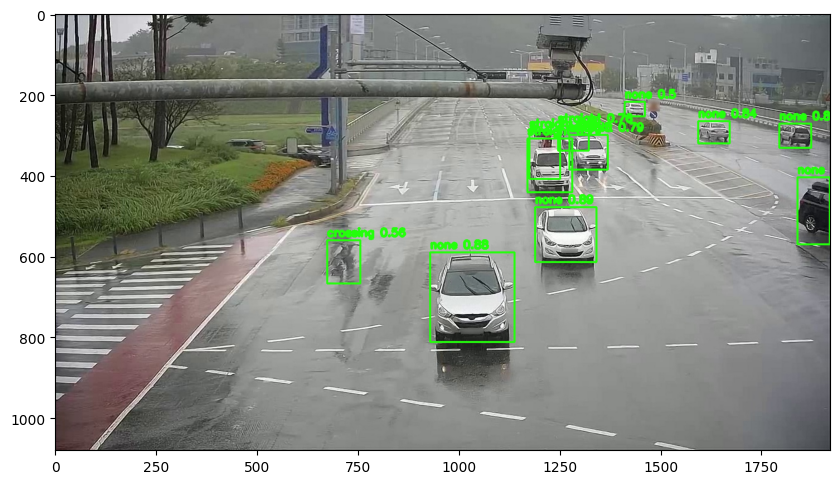

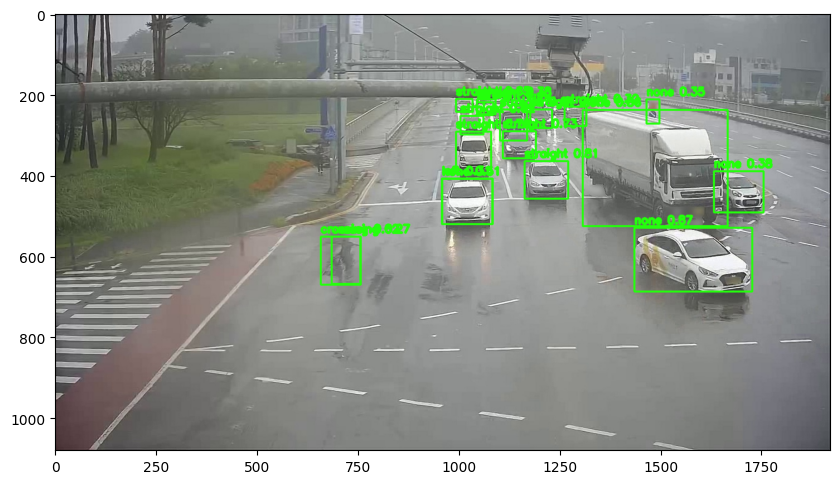

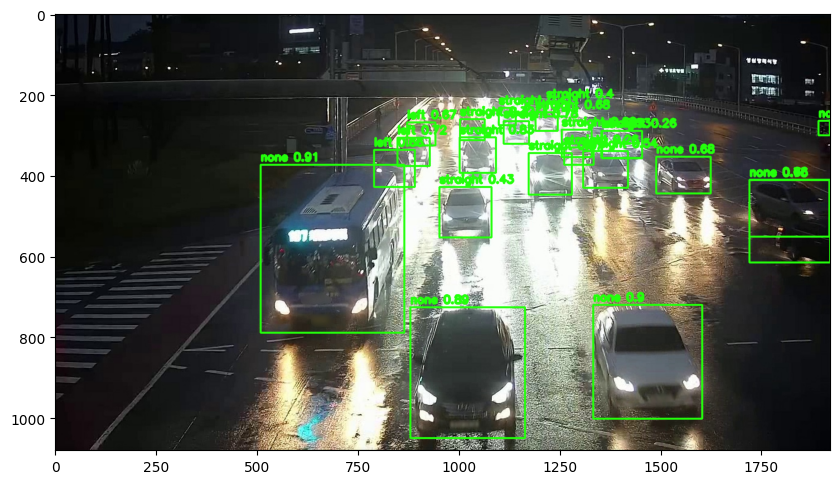

...

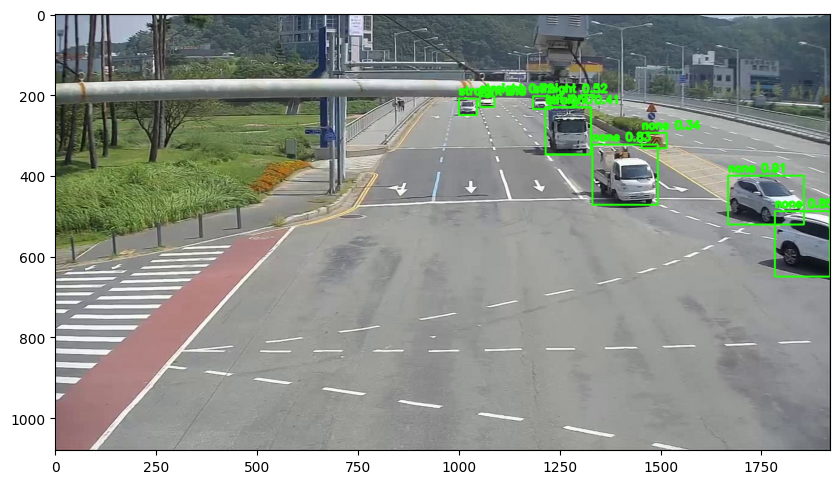

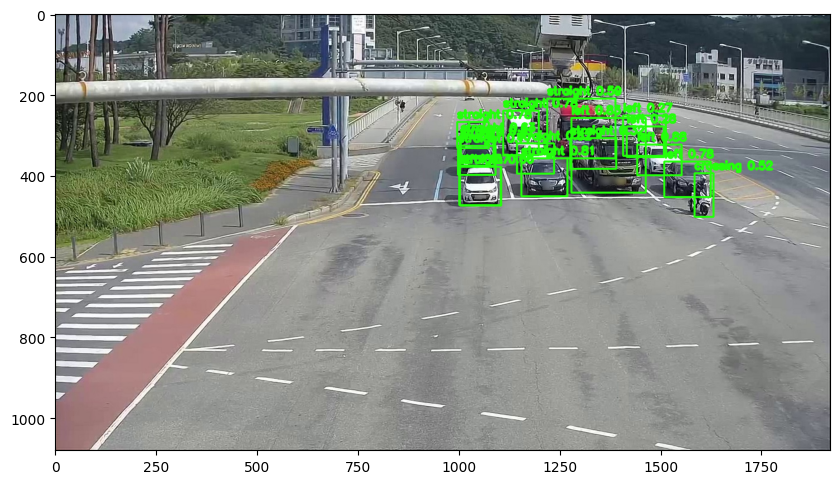

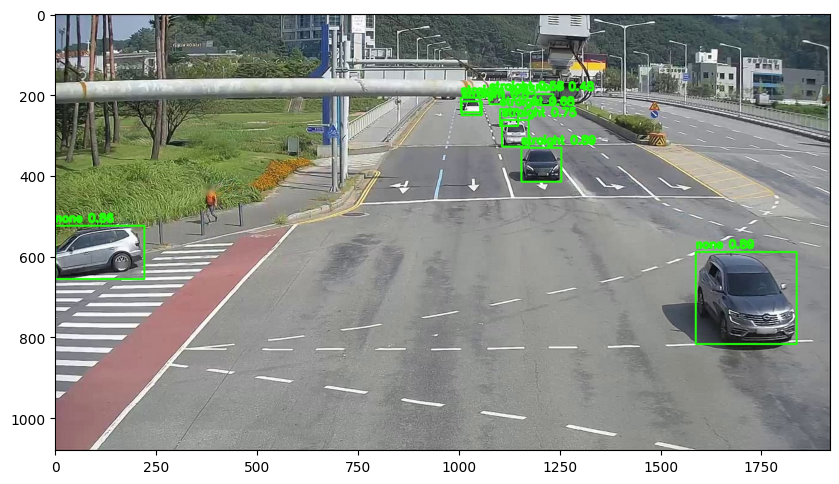

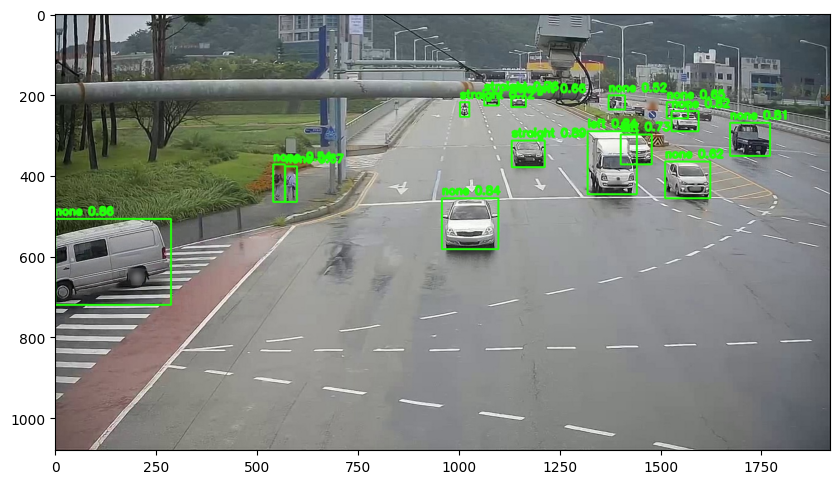

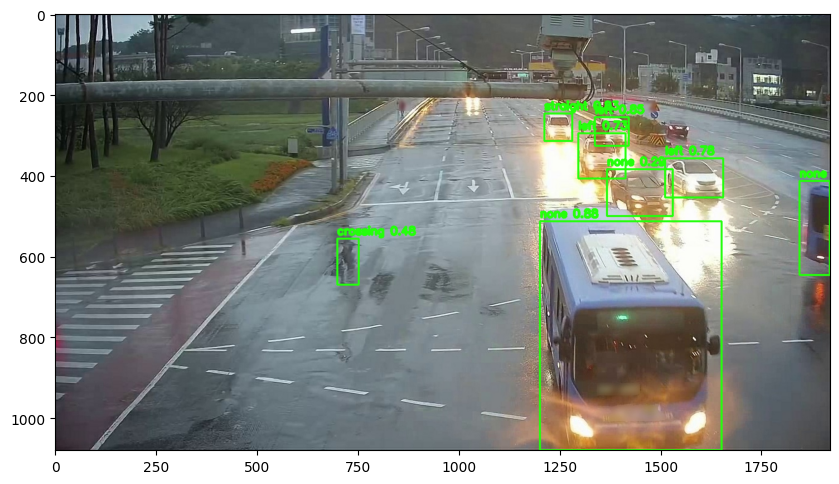

KeyboardInterrupt: ignored

In [ ]:
import matplotlib.pyplot as plt
for i in range(len(test_paths)):
  img = cv2.cvtColor(cv2.imread(test_paths[i]), cv2.COLOR_BGR2RGB)

  # verbose=False is set to disable logging results
  results = model(img, imgsz=IMGSZ, verbose=False)[0]

  # draw results
  for box in results.boxes.data:
      box = box.cpu()
      bbox = box[:4].numpy().astype(np.int32)
      conf, cls_id = box[4].item(), int(box[5].item())
      cls = id2label[cls_id]

      text = f"{cls} {round(conf, 2)}"
      img = cv2.rectangle(img, (bbox[0], bbox[1]), (bbox[2], bbox[3]), (36, 255, 12), 3)
      cv2.putText(img, text, (bbox[0], bbox[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (36, 255, 12), 6)

  # 이미지 크기 지정
  fig = plt.figure(figsize=(10, 10))

  # 이미지 표시
  plt.imshow(img)

  # 플롯 업데이트
  plt.show()

## Tracking predict

## 동영상에 모델 적용

### 동영상 프레임들로 저장

In [ ]:
import cv2
import os

# 동영상 파일 사용시
video_path = "/content/drive/MyDrive/Optimizing_traffic_lights_project/total_dataset/동영상파일/10초.mp4"
cap = cv2.VideoCapture(video_path)

# 디렉토리 생성
output_images_dir = '/content/drive/MyDrive/frames'
os.makedirs(output_images_dir, exist_ok=True)

frame_number = 0  # 프레임 번호 초기화

# Loop through the video frames
while cap.isOpened():
    # Read a frame from the video
    success, frame = cap.read()

    if success:
        # Run YOLOv8 inference on the frame
        results = model(frame)

        # Visualize the results on the frame
        annotated_frame = results[0].plot()


        # Save the annotated frame as an image
        image_filename = f"frame_{frame_number:04d}.jpg"
        image_path = os.path.join(output_images_dir, image_filename)
        cv2.imwrite(image_path, annotated_frame)

        frame_number += 1
    else:
        # Break the loop if the end of the video is reached
        break

# Release the video capture object and close the display window
cap.release()
cv2.destroyAllWindows()

### 프레임들을 다시 동영상으로 저장

In [ ]:
# Generate the video from saved images
def generate_video(output_images_dir, video_filename='/content/drive/MyDrive/'+'output_video.mp4', fps=10):
    image_files = [os.path.join(output_images_dir, f) for f in os.listdir(output_images_dir) if f.endswith('.jpg')]
    image_files.sort(key=lambda x: int(x.split('_')[1].split('.')[0]))

    frame = cv2.imread(image_files[0])
    height, width, layers = frame.shape

    video = cv2.VideoWriter(video_filename, cv2.VideoWriter_fourcc(*'mp4v'), fps, (width, height))

    for image_file in image_files:
        video.write(cv2.imread(image_file))

    cv2.destroyAllWindows()
    video.release()

# Generate the video from saved images
generate_video(output_images_dir)
print('Video generated successfully.')

Video generated successfully.
